In [ ]:
!pip install git+https://github.com/nghorbani/human_body_prior
!pip install omegaconf
!pip install loguru
!pip install trimesh

from google.colab import drive
drive.mount('/content/gdrive')

from os import path as osp

support_dir = '/content/gdrive/MyDrive/CV2/VPoserModelFiles/'
expr_dir = osp.join(support_dir, 'vposer_v2_05/')
bm_fname = osp.join(support_dir, 'smplx_neutral_model.npz')
sample_amass_fname = osp.join(support_dir, 'amass_sample.npz')

print(expr_dir)
print(bm_fname)
print(sample_amass_fname)

import torch
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('device is', device)

from human_body_prior.body_model.body_model import BodyModel
bm = BodyModel(bm_fname=bm_fname).to(device)

from human_body_prior.tools.model_loader import load_model
from human_body_prior.models.vposer_model import VPoser

vp, ps = load_model(expr_dir, model_code=VPoser,
                    remove_words_in_model_weights='vp_model.',
                    disable_grad=True,
                    comp_device=device)
vp = vp.to(device)

poses = np.load(sample_amass_fname)['poses']
print('poses.shape', poses.shape)

amass_body_pose = np.load(sample_amass_fname)['poses'][:, 3:66]
amass_body_pose = torch.from_numpy(amass_body_pose).type(torch.float).to(device)
print('amass_body_pose.shape', amass_body_pose.shape)

amass_body_poZ = vp.encode(amass_body_pose).mean
print('amass_body_poZ.shape', amass_body_poZ.shape)

amass_body_pose_rec = vp.decode(amass_body_poZ)['pose_body'].contiguous().view(-1, 63)
print('amass_body_pose_rec.shape', amass_body_pose_rec.shape)


  Cloning https://github.com/nghorbani/human_body_prior to /tmp/pip-req-build-b2gbjcmk
  Running command git clone --filter=blob:none --quiet https://github.com/nghorbani/human_body_prior /tmp/pip-req-build-b2gbjcmk
  Resolved https://github.com/nghorbani/human_body_prior to commit 4c246d8a83ce16d3cff9c79dcf04d81fa440a6bc
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.3/709.3 kB 17.7 MB/s eta 0:00:00
Mounted at /content/gdrive
/content/gdrive/MyDrive/CV2/VPoserModelFiles/vposer_v2_05/
/content/gdrive/MyDrive/CV2/VPoserModelFiles/smplx_neutral_model.npz
/content/gdrive/MyDrive/CV2/VPoserModelFiles/amass_sample.npz
device is cuda


2025-04-28 02:50:58.781 | INFO     | human_body_prior.tools.model_loader:load_model:97 - Loaded model in eval mode with trained weights: /content/gdrive/MyDrive/CV2/VPoserModelFiles/vposer_v2_05/snapshots/V02_05_epoch=13_val_loss=0.03.ckpt


poses.shape (500, 156)
amass_body_pose.shape torch.Size([500, 63])
amass_body_poZ.shape torch.Size([500, 32])
amass_body_pose_rec.shape torch.Size([500, 63])


In [ ]:
#get vertices and faces of a polygonal mesh model for each body pose

from human_body_prior.tools.omni_tools import copy2cpu as c2c
import trimesh

originalPoses = {'pose_body':amass_body_pose}
recoveredPoses = {'pose_body':amass_body_pose_rec}

bmodelorig = bm(**originalPoses);
bmodelreco = bm(**recoveredPoses);
vorig = c2c(bmodelorig.v)
vreco = c2c(bmodelreco.v)
faces = c2c(bm.f)

T, num_verts = vorig.shape[:-1]

#visualize one frame's body pose before (grey) and after (purple) encode-decode
fIdx = 100
verts = vorig[fIdx]
mesh1 = trimesh.base.Trimesh(verts, faces)
mesh1.visual.vertex_colors = [254, 254, 254]
verts = vreco[fIdx]
mesh2 = trimesh.base.Trimesh(verts, faces)
mesh2.visual.vertex_colors = [254, 66, 200]
mesh2.apply_translation([1, 0, 0])  #use [0,0,0] to overlay them on each other
meshes = [mesh1, mesh2]
trimesh.Scene(meshes).show()

#visualize a temporal subsequence of poses spatially (use mouse to rotate view)
#note that encoding followed by decoding is not a lossless process,
#it can introduce a certain amount of error all by itself

meshes = []
for fIdx in range(0,200,10):
    verts = vorig[fIdx]
    mesh1 = trimesh.base.Trimesh(verts, faces)
    mesh1.visual.vertex_colors = [254, 254, 254]
    mesh1.apply_translation([0, 0, fIdx*.07])
    meshes.append(mesh1)
    verts = vreco[fIdx]
    mesh1 = trimesh.base.Trimesh(verts, faces)
    mesh1.visual.vertex_colors = [254, 150, 200]
    mesh1.apply_translation([0, 0, fIdx*.07])
    meshes.append(mesh1)

trimesh.Scene(meshes).show()

# extract and visualize 23 body joints before and after encode-decode process
# for a pose where error between original pose and decoded pose is rather large.
# why 23 instead of 21 mentioned earlier?  There are two extra joints somewhere
# that are not among the 21 rotatable body joints used by VPoser.

fIdx = 130

verts = vorig[fIdx]
mesh1 = trimesh.base.Trimesh(verts, faces)
mesh1.visual.vertex_colors = [254, 254, 254]
verts = vreco[fIdx]
mesh2 = trimesh.base.Trimesh(verts, faces)
mesh2.visual.vertex_colors = [254, 66, 200]
mesh2.apply_translation([0, 0, 0])  #use [0,0,0] to overlay them on each other
meshes = [mesh1, mesh2]


#get the 23 major 3D body joints
joints = c2c(bmodelorig.Jtr[fIdx])
origjoints = joints[0:23, :]   #ignore finger joints
joints = c2c(bmodelreco.Jtr[fIdx])
recojoints = joints[0:23, :]   #ignore finger joints

print(origjoints.shape, recojoints.shape)
for i in range(origjoints.shape[0]):
    sphere = trimesh.primitives.Sphere(radius=.02, center=origjoints[i,:])
    sphere.apply_translation([1, 0, 0])
    sphere.visual.vertex_colors = [254, 254, 254]
    meshes.append(sphere)
    sphere = trimesh.primitives.Sphere(radius=.02, center=recojoints[i,:])
    sphere.apply_translation([1, 0, 0])
    sphere.visual.vertex_colors = [254, 150, 200]
    meshes.append(sphere)

trimesh.Scene(meshes).show()

#visualize one frame's body pose before (grey) and after (purple) encode-decode
fIdx = 100
verts = vorig[fIdx]
mesh1 = trimesh.base.Trimesh(verts, faces)
mesh1.visual.vertex_colors = [254, 254, 254]
verts = vreco[fIdx]
mesh2 = trimesh.base.Trimesh(verts, faces)
mesh2.visual.vertex_colors = [254, 66, 200]
mesh2.apply_translation([1, 0, 0])  #use [0,0,0] to overlay them on each other
meshes = [mesh1, mesh2]
trimesh.Scene(meshes).show()

(23, 3) (23, 3)


In [ ]:
#visualize a temporal subsequence of poses spatially (use mouse to rotate view)
#note that encoding followed by decoding is not a lossless process,
#it can introduce a certain amount of error all by itself

meshes = []
for fIdx in range(0,200,10):
    verts = vorig[fIdx]
    mesh1 = trimesh.base.Trimesh(verts, faces)
    mesh1.visual.vertex_colors = [254, 254, 254]
    mesh1.apply_translation([0, 0, fIdx*.07])
    meshes.append(mesh1)
    verts = vreco[fIdx]
    mesh1 = trimesh.base.Trimesh(verts, faces)
    mesh1.visual.vertex_colors = [254, 150, 200]
    mesh1.apply_translation([0, 0, fIdx*.07])
    meshes.append(mesh1)

trimesh.Scene(meshes).show()

In [ ]:
!git clone https://github.com/amrutha-psu/AMASS_Dataset.git

import os
import numpy as np
import torch
from torch.utils.data import TensorDataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

data_dir = "/content/AMASS_Dataset/AMASS_CMUsubset/"
npz_files = [os.path.join(data_dir, f) for f in os.listdir(data_dir) if f.endswith('.npz')]
print(f"Found {len(npz_files)} .npz files.")

def prepare_training_data(latent_codes, input_len=7, output_len=30, subsample_factor=4):
    X, Y = [], []
    window_size = (input_len + output_len) * subsample_factor

    for i in range(0, len(latent_codes) - window_size + 1):
        full_window = latent_codes[i:i+window_size]
        X_seq = full_window[::subsample_factor][:input_len]
        Y_seq = full_window[input_len*subsample_factor::subsample_factor][:output_len]
        X.append(X_seq)
        Y.append(Y_seq)

    return np.array(X), np.array(Y)

def process_files(file_list, device, vp, input_len=7, output_len=30, subsample_factor=4, latent_mean=None, latent_std=None):
    all_X, all_Y = [], []
    all_latent = []

    if latent_mean is None or latent_std is None:
        for file_path in file_list:
            try:
                data = np.load(file_path)
                poses = data['poses'][:, 3:66]
                with torch.no_grad():
                    poses_tensor = torch.tensor(poses).float().to(device)
                    latent = vp.encode(poses_tensor).mean.cpu().numpy()
                all_latent.append(latent)
            except Exception as e:
                print(f"Error processing file {file_path}: {e}")
                continue

        if all_latent:
            full_latent = np.concatenate(all_latent)
            latent_mean = full_latent.mean(axis=0)
            latent_std = full_latent.std(axis=0) + 1e-8
        else:
            return np.array([]), np.array([]), None, None

    for file_path in file_list:
        try:
            data = np.load(file_path)
            poses = data['poses'][:, 3:66]
            with torch.no_grad():
                poses_tensor = torch.tensor(poses).float().to(device)
                latent = vp.encode(poses_tensor).mean.cpu().numpy()

            latent_norm = (latent - latent_mean) / latent_std
            X, Y = prepare_training_data(latent_norm, input_len, output_len, subsample_factor)
            all_X.append(X)
            all_Y.append(Y)
        except Exception as e:
            continue

    return np.concatenate(all_X) if all_X else np.array([]), np.concatenate(all_Y) if all_Y else np.array([]), latent_mean, latent_std

subject_groups = {
    '01': [], '02': [], '05': [],
    '06': [], '12': [], '13': []
}

# split the poses for the npz file for each subject group
for f in npz_files:
    subject = f.split('/')[-1].split('_')[0]
    if subject in subject_groups:
        subject_groups[subject].append(f)

train_subjects = ['01', '02', '06']
val_subjects = ['13']
test_subjects = ['05', '12']

train_files = [f for sub in train_subjects for f in subject_groups.get(sub, [])]
val_files = [f for sub in val_subjects for f in subject_groups.get(sub, [])]
test_files = [f for sub in test_subjects for f in subject_groups.get(sub, [])]

print(f"Training files: {len(train_files)}")
print(f"Validation files: {len(val_files)}")
print(f"Test files: {len(test_files)}")


if 'vp' in locals():
    X_train, Y_train, latent_mean, latent_std = process_files(train_files, device, vp)
    X_val, Y_val, _, _ = process_files(val_files, device, vp, latent_mean=latent_mean, latent_std=latent_std)
    X_test, Y_test, _, _ = process_files(test_files, device, vp, latent_mean=latent_mean, latent_std=latent_std)

    if X_train.size > 0 and Y_train.size > 0:
        train_dataset = TensorDataset(
            torch.tensor(X_train, dtype=torch.float32).to(device),
            torch.tensor(Y_train, dtype=torch.float32).to(device)
        )
        print(f"Training dataset size: {len(train_dataset)}")
    else:
        train_dataset = None

    if X_val.size > 0 and Y_val.size > 0:
        val_dataset = TensorDataset(
            torch.tensor(X_val, dtype=torch.float32).to(device),
            torch.tensor(Y_val, dtype=torch.float32).to(device)
        )
        print(f"Validation dataset size: {len(val_dataset)}")
    else:
        val_dataset = None

    if X_test.size > 0 and Y_test.size > 0:
        test_dataset = TensorDataset(
            torch.tensor(X_test, dtype=torch.float32).to(device),
            torch.tensor(Y_test, dtype=torch.float32).to(device)
        )
        print(f"Test dataset size: {len(test_dataset)}")
    else:
        test_dataset = None

batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

Cloning into 'AMASS_Dataset'...
remote: Enumerating objects: 106, done.
remote: Total 106 (delta 0), reused 0 (delta 0), pack-reused 106 (from 2)
Receiving objects: 100% (106/106), 112.05 MiB | 27.53 MiB/s, done.
Resolving deltas: 100% (94/94), done.
Updating files: 100% (100/100), done.
Found 100 .npz files.
Training files: 34
Validation files: 42
Test files: 24
Training dataset size: 61377
Validation dataset size: 102659
Test dataset size: 34632


In [ ]:
import numpy as np
import torch


class ConstantPositionModel(torch.nn.Module):
    def __init__(self, output_len):
        super().__init__()
        self.output_len = output_len

    def predict(self, input_sequence: torch.Tensor) -> torch.Tensor:
        last_pose = input_sequence[:, -1:, :]
        return last_pose.repeat(1, self.output_len, 1)

class ConstantVelocityModel(torch.nn.Module):
    def __init__(self, output_len):
        super().__init__()
        self.output_len = output_len
    def predict(self, input_sequence: torch.Tensor) -> torch.Tensor:
        last = input_sequence[:, -1, :]
        prev = input_sequence[:, -2, :]
        velocity = last - prev
        steps = torch.arange(1, self.output_len + 1).float().to(input_sequence.device)
        preds = last[:, None, :] + velocity[:, None, :] * steps[None, :, None]
        return preds

def evaluate_model(model, test_loader, model_name="Model"):
    total_error = 0
    num_samples = 0
    total_batches = len(test_loader)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    with torch.no_grad():
        for batch_idx, (batch_x, batch_y) in enumerate(test_loader):
            print(f"Processing batch {batch_idx}/{total_batches} for {model_name}")
            batch_x = batch_x.to(device)
            batch_y = batch_y.to(device)
            pred_z = model.predict(batch_x)
            batch_size, seq_len, latent_dim = pred_z.shape
            batch_y = batch_y[:, :seq_len, :]
            pred_z_reshaped = pred_z.reshape(-1, latent_dim)
            batch_y_reshaped = batch_y.reshape(-1, latent_dim)
            decoded_pred = vp.decode(pred_z_reshaped)
            decoded_true = vp.decode(batch_y_reshaped)
            pred_pose_body = decoded_pred['pose_body'].contiguous().view(-1, 63)
            true_pose_body = decoded_true['pose_body'].contiguous().view(-1, 63)
            pred_joints = bm(pose_body=pred_pose_body).Jtr[:, :21, :]
            true_joints = bm(pose_body=true_pose_body).Jtr[:, :21, :]
            pred_joints = pred_joints.view(batch_size, seq_len, 21, 3).contiguous()
            true_joints = true_joints.view(batch_size, seq_len, 21, 3).contiguous()
            error = torch.norm(pred_joints - true_joints, dim=3).mean()
            total_error += error.item() * batch_size
            num_samples += batch_size

    return (total_error / num_samples) * 1000

cp_model = ConstantPositionModel(output_len=30)
cv_model = ConstantVelocityModel(output_len=30)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cp_model.to(device)
cv_model.to(device)

cp_mpjpe = evaluate_model(cp_model, test_loader, "Constant Position")
cv_mpjpe = evaluate_model(cv_model, test_loader, "Constant Velocity")

print(f"Constant Position MPJPE: {cp_mpjpe:.2f} mm")
print(f"Constant Velocity MPJPE: {cv_mpjpe:.2f} mm")
print(f"Improvement: {(cp_mpjpe - cv_mpjpe) / cp_mpjpe * 100:.2f}%")


Processing batch 0/271 for Constant Position
Processing batch 1/271 for Constant Position
Processing batch 2/271 for Constant Position
Processing batch 3/271 for Constant Position
Processing batch 4/271 for Constant Position
Processing batch 5/271 for Constant Position
Processing batch 6/271 for Constant Position
Processing batch 7/271 for Constant Position
Processing batch 8/271 for Constant Position
Processing batch 9/271 for Constant Position
Processing batch 10/271 for Constant Position
Processing batch 11/271 for Constant Position
Processing batch 12/271 for Constant Position
Processing batch 13/271 for Constant Position
Processing batch 14/271 for Constant Position
Processing batch 15/271 for Constant Position
Processing batch 16/271 for Constant Position
Processing batch 17/271 for Constant Position
Processing batch 18/271 for Constant Position
Processing batch 19/271 for Constant Position
Processing batch 20/271 for Constant Position
Processing batch 21/271 for Constant Positio

In [ ]:

cp_model = ConstantPositionModel(output_len=1)
cv_model = ConstantVelocityModel(output_len=1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cp_model.to(device)
cv_model.to(device)

cp_mpjpe = evaluate_model(cp_model, test_loader, "Constant Position")
cv_mpjpe = evaluate_model(cv_model, test_loader, "Constant Velocity")

print(f"Constant Position MPJPE: {cp_mpjpe:.2f} mm")
print(f"Constant Velocity MPJPE: {cv_mpjpe:.2f} mm")
print(f"Improvement: {(cp_mpjpe - cv_mpjpe) / cp_mpjpe * 100:.2f}%")


Processing batch 0/271 for Constant Position
Processing batch 1/271 for Constant Position
Processing batch 2/271 for Constant Position
Processing batch 3/271 for Constant Position
Processing batch 4/271 for Constant Position
Processing batch 5/271 for Constant Position
Processing batch 6/271 for Constant Position
Processing batch 7/271 for Constant Position
Processing batch 8/271 for Constant Position
Processing batch 9/271 for Constant Position
Processing batch 10/271 for Constant Position
Processing batch 11/271 for Constant Position
Processing batch 12/271 for Constant Position
Processing batch 13/271 for Constant Position
Processing batch 14/271 for Constant Position
Processing batch 15/271 for Constant Position
Processing batch 16/271 for Constant Position
Processing batch 17/271 for Constant Position
Processing batch 18/271 for Constant Position
Processing batch 19/271 for Constant Position
Processing batch 20/271 for Constant Position
Processing batch 21/271 for Constant Positio

Epoch 1/20, Train Loss: 0.1493, Val MPJPE: 51.75 mm
Model saved with validation MPJPE: 51.75 mm
Epoch 2/20, Train Loss: 0.0810, Val MPJPE: 32.65 mm
Model saved with validation MPJPE: 32.65 mm
Epoch 3/20, Train Loss: 0.0656, Val MPJPE: 27.41 mm
Model saved with validation MPJPE: 27.41 mm
Epoch 4/20, Train Loss: 0.0610, Val MPJPE: 23.01 mm
Model saved with validation MPJPE: 23.01 mm
Epoch 5/20, Train Loss: 0.0565, Val MPJPE: 20.85 mm
Model saved with validation MPJPE: 20.85 mm
Epoch 6/20, Train Loss: 0.0556, Val MPJPE: 21.02 mm
Epoch 7/20, Train Loss: 0.0546, Val MPJPE: 21.00 mm
Epoch 8/20, Train Loss: 0.0531, Val MPJPE: 19.58 mm
Model saved with validation MPJPE: 19.58 mm
Epoch 9/20, Train Loss: 0.0529, Val MPJPE: 18.79 mm
Model saved with validation MPJPE: 18.79 mm
Epoch 10/20, Train Loss: 0.0528, Val MPJPE: 15.77 mm
Model saved with validation MPJPE: 15.77 mm
Epoch 11/20, Train Loss: 0.0512, Val MPJPE: 18.37 mm
Epoch 12/20, Train Loss: 0.0510, Val MPJPE: 20.90 mm
Epoch 13/20, Train Lo

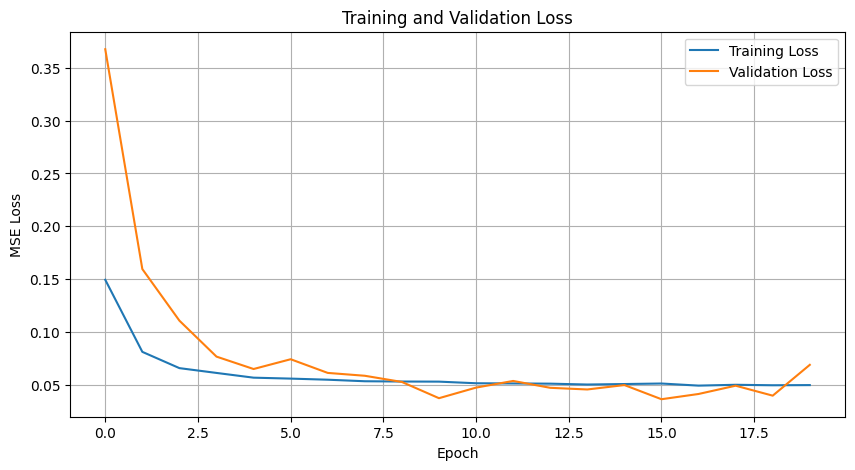

In [ ]:
import torch
import torch.nn as nn
import numpy as np
from torch.utils.data import DataLoader, random_split
import matplotlib.pyplot as plt

class MotionGRU(nn.Module):
    def __init__(self, input_dim=32, hidden_dim=1024, output_dim=32, num_layers=2):
        super(MotionGRU, self).__init__()
        self.encoder = nn.GRU(input_size=input_dim, hidden_size=hidden_dim, num_layers=num_layers, batch_first=True, dropout=0.3 if num_layers > 1 else 0)
        self.decoder = nn.GRU(input_size=input_dim, hidden_size=hidden_dim, num_layers=num_layers, batch_first=True, dropout=0.3 if num_layers > 1 else 0)
        self.projection = nn.Sequential(nn.Linear(hidden_dim, hidden_dim//2), nn.ReLU(), nn.Dropout(0.3), nn.Linear(hidden_dim//2, output_dim))
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.output_dim = output_dim

    def forward(self, x, future_steps=30, teacher_forcing_ratio=0.5):
        batch_size = x.size(0)
        device = x.device
        _, h_n = self.encoder(x)
        outputs = torch.zeros(batch_size, future_steps, self.output_dim).to(device)
        decoder_input = x[:, -1:, :]
        for t in range(future_steps):
            _, h_n = self.decoder(decoder_input, h_n)
            output = self.projection(h_n[-1])
            outputs[:, t:t+1, :] = output.unsqueeze(1)
            use_teacher_forcing = torch.rand(1).item() < teacher_forcing_ratio
            if use_teacher_forcing and hasattr(self, 'targets') and t < self.targets.size(1):
                decoder_input = self.targets[:, t:t+1, :]
            else:
                decoder_input = output.unsqueeze(1)
        return outputs

    def predict(self, input_sequence):
        self.eval()
        with torch.no_grad():
            if isinstance(input_sequence, np.ndarray):
                input_tensor = torch.tensor(input_sequence, dtype=torch.float32).to(next(self.parameters()).device)
            else:
                input_tensor = input_sequence.to(next(self.parameters()).device)
            outputs = self.forward(input_tensor, teacher_forcing_ratio=0)
            return outputs.cpu().numpy()

def evaluate_model(model, data_loader, device, vp, bm):
    """Calculate MPJPE for the model"""
    total_error = 0
    num_samples = 0
    model.eval()
    with torch.no_grad():
        for batch_idx, (batch_x, batch_y) in enumerate(data_loader):
            batch_x = batch_x.to(device)
            batch_y = batch_y.to(device)
            pred_z = torch.tensor(model.predict(batch_x.cpu().numpy()), dtype=torch.float32).to(device)
            decoded_pred = vp.decode(pred_z.reshape(-1, 32))
            decoded_true = vp.decode(batch_y.reshape(-1, 32))
            pred_pose_body = decoded_pred['pose_body'].contiguous().view(-1, 63)
            true_pose_body = decoded_true['pose_body'].contiguous().view(-1, 63)
            pred_joints = bm(pose_body=pred_pose_body).Jtr[:, :21, :]
            true_joints = bm(pose_body=true_pose_body).Jtr[:, :21, :]
            error = torch.norm(pred_joints - true_joints, dim=-1).mean()
            total_error += error.item() * batch_x.size(0)
            num_samples += batch_x.size(0)
    return (total_error / num_samples) * 1000

motion_gru = MotionGRU(input_dim=32, hidden_dim=1024, output_dim=32).to(device)

optimizer = torch.optim.Adam(motion_gru.parameters(), lr=0.0005, weight_decay=1e-5)
criterion = nn.MSELoss()

if 'train_dataset' in locals():
    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = random_split(train_dataset, [train_size, val_size])
    train_loader = DataLoader(train_subset, batch_size=64, shuffle=True)
    val_loader = DataLoader(val_subset, batch_size=64)
else:
    print("Error: train_dataset is not defined. Please run the data preparation steps first.")
    train_loader = None
    val_loader = None

num_epochs = 20
patience = 15
best_val_mpjpe = float('inf')
epochs_no_improve = 0

train_losses = []
val_losses = []

if train_loader is not None and val_loader is not None:
    for epoch in range(num_epochs):
        motion_gru.train()
        train_loss = 0
        for batch_x, batch_y in train_loader:
            batch_x, batch_y = batch_x.to(device), batch_y.to(device)
            motion_gru.targets = batch_y
            optimizer.zero_grad()
            outputs = motion_gru(batch_x, future_steps=batch_y.size(1), teacher_forcing_ratio=0.5)
            loss = criterion(outputs, batch_y)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(motion_gru.parameters(), max_norm=1.0)
            optimizer.step()
            train_loss += loss.item()

        avg_train_loss = train_loss / len(train_loader)
        train_losses.append(avg_train_loss) # Append train loss


        # Validation MPJPE calculation
        val_mpjpe = evaluate_model(motion_gru, val_loader, device, vp, bm)
        val_loss = 0
        with torch.no_grad():
             for batch_x, batch_y in val_loader:
                batch_x, batch_y = batch_x.to(device), batch_y.to(device)
                outputs = motion_gru(batch_x, future_steps=batch_y.size(1), teacher_forcing_ratio=0)
                loss = criterion(outputs, batch_y)
                val_loss += loss.item()
        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {avg_train_loss:.4f}, Val MPJPE: {val_mpjpe:.2f} mm')

        # Save best model based on validation MPJPE and early stopping
        if val_mpjpe < best_val_mpjpe:
            best_val_mpjpe = val_mpjpe
            torch.save(motion_gru.state_dict(), 'best_motion_gru.pth')
            print(f'Model saved with validation MPJPE: {val_mpjpe:.2f} mm')
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve == patience:
                break

    motion_gru.load_state_dict(torch.load('best_motion_gru.pth'))

    motion_gru_mpjpe_test = evaluate_model(motion_gru, test_loader, device, vp, bm) # Use the same evaluate_model for testing
    print(f"Motion GRU MPJPE on Test Set: {motion_gru_mpjpe_test:.2f} mm")

    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('MSE Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

else:
    print("Skipping training and evaluation due to undefined train_dataset.")


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
motion_gru = MotionGRU(input_dim=32, hidden_dim=1024, output_dim=32).to(device)
motion_gru.load_state_dict(torch.load('best_motion_gru.pth', map_location=device))
motion_gru.eval()

def visualize_predictions(batch_x, batch_y, predicted_z, vp, bm, frame_idx=0):
    pred_z_frame = predicted_z[:, frame_idx, :]
    true_z_frame = batch_y[:, frame_idx, :]

    # Decode latent codes using VPoser
    decoded_pred = vp.decode(pred_z_frame)
    decoded_true = vp.decode(true_z_frame)

    # Get pose_body from decoded results
    pred_pose_body = decoded_pred['pose_body'].contiguous().view(-1, 63)
    true_pose_body = decoded_true['pose_body'].contiguous().view(-1, 63)

    # Generate body models
    with torch.no_grad():
        pred_bm = bm(pose_body=pred_pose_body)
        true_bm = bm(pose_body=true_pose_body)

    return pred_bm, true_bm

# Get a test batch
test_batch = next(iter(test_loader))
batch_x, batch_y = test_batch
batch_x = batch_x.to(device)
batch_y = batch_y.to(device)

# Generate predictions
with torch.no_grad():
    predicted_z = motion_gru(batch_x, future_steps=batch_y.size(1))

# Visualize predictions
pred_bm, true_bm = visualize_predictions(batch_x, batch_y, predicted_z, vp, bm, frame_idx=29)

# Convert vertices to numpy and visualize
def c2c(x):
    return x.detach().cpu().numpy() if isinstance(x, torch.Tensor) else x

faces = c2c(bm.f)
true_verts = c2c(true_bm.v[0])
pred_verts = c2c(pred_bm.v[0])

# Create meshes
mesh_true = trimesh.Trimesh(vertices=true_verts, faces=faces)
mesh_pred = trimesh.Trimesh(vertices=pred_verts, faces=faces)
mesh_pred.apply_translation([1.5, 0, 0])  # Offset for visualization

# Show scene
trimesh.Scene([mesh_true, mesh_pred]).show()